# Professor Bear :: Image Analysis :: Sobel

## Professor Bear github


Code for Professor Bear YouTube videos at https://github.com/nikbearbrown


## Download Anaconda 4 for Python 2.7

Download Anaconda 4 for  Python 2.7 version
[https://www.continuum.io/downloads](https://www.continuum.io/downloads)
    
Anaconda 4.3.0 includes an easy installation of Python (2.7.13, 3.4.5, 3.5.2, and/or 3.6.0) and updates of over 100 pre-built and tested scientific and analytic Python packages. These packages include NumPy, Pandas, SciPy, Matplotlib, and Jupyter. Over 620 more packages are available.    
[https://docs.continuum.io/anaconda/pkg-docs](https://docs.continuum.io/anaconda/pkg-docs)
        

## iPython

Go to the directory that has your iPython notebook

At the command line type

_jupyter notebook notebookname_

_ipython notebook notebookname_  will also work

For example,

jupyter notebook Professor_Bear_Image_Analysis_Loading_Histograms.ipynb



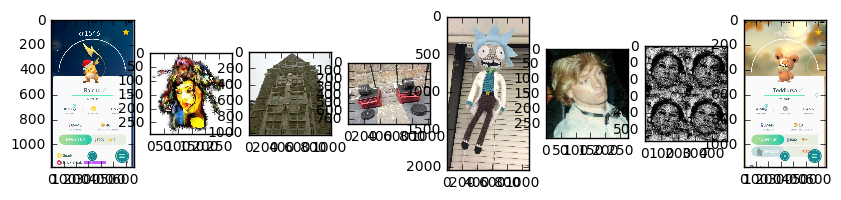

In [1]:
# Bring in python image analysis libraries
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from skimage import color
import skimage.filters as filters
from skimage.transform import hough_circle
from skimage.feature import peak_local_max
from skimage import feature
from skimage import morphology
from skimage.draw import circle_perimeter
from skimage import img_as_float, img_as_ubyte
from skimage import segmentation as seg
from skimage.morphology import watershed
from scipy import ndimage as nd
from scipy.ndimage import convolve
from skimage import feature
import glob # for bulk file import

# Set defaults
plt.rcParams['image.cmap'] = 'gray' # Display grayscale images in... grayscale.
plt.rcParams['image.interpolation'] = 'none' # Use nearest-neighbour
plt.rcParams['figure.figsize'] = 10, 10

# Import test images
imgpaths = glob.glob("./img/*.jpg") + glob.glob("./img/*.png")
# imgpaths = glob.glob("images/*.jpg") + glob.glob("images/*.png")  Windows
# Windows has different relative paths than Mac/Unix
imgset = [mpimg.imread(x) for x in imgpaths]

# Display thumbnails of the images to ensure loading
plt.figure()
for i,img in enumerate(imgset):
    plt.subplot(1, len(imgset), i+1)
    plt.imshow(img, cmap = 'gray')

## Sobel

The Sobel operator (https://en.wikipedia.org/wiki/Sobel_operator) uses two 3×3 kernels which are convolved with the original image to calculate approximations of the derivatives – one for horizontal changes, and one for vertical. If we define A as the source image, and Gx and Gy are two images which at each point contain the horizontal and vertical derivative approximations respectively, the computations are as follows

Gx = np.array([[-1, 0, +1],[-2, 0, +2],[-1, 0, +1]])
Gy = -Gx.transpose()

Since the Sobel kernels can be decomposed as the products of an averaging and a differentiation kernel, they compute the gradient with smoothing

In [2]:
# Find horizontal edges using a simple shifting method
def find_horizontal_edges(img):
    imgbw = img_as_float(color.rgb2grey(img))
    return np.abs(imgbw[:, 1:] - imgbw[:, :-1])

# Find vertical edges using a simple shifting method
def find_vertical_edges(img):
    imgbw = img_as_float(color.rgb2grey(img))
    return np.abs(imgbw[1:, :] - imgbw[:-1, :])

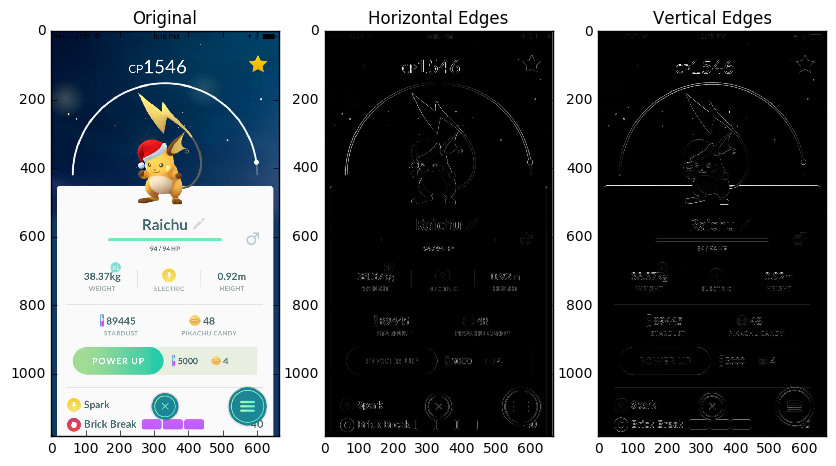

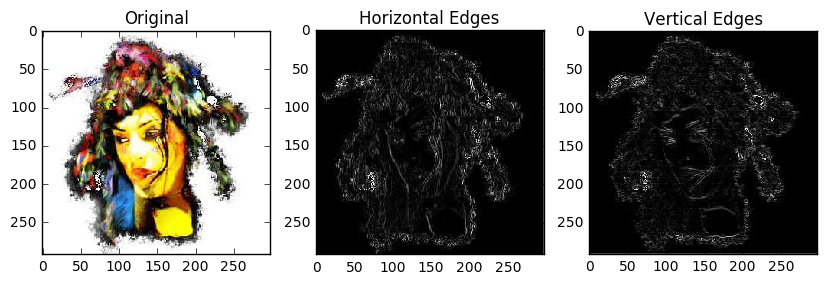

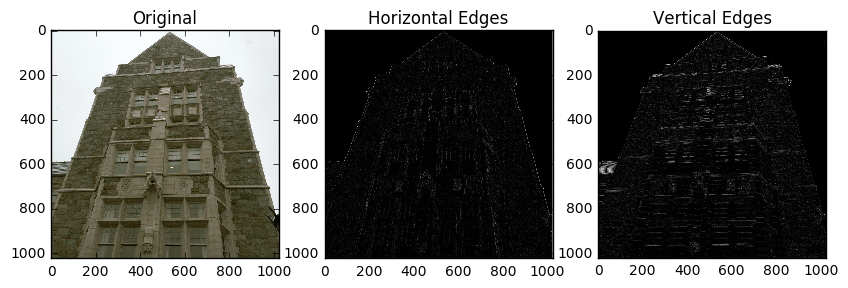

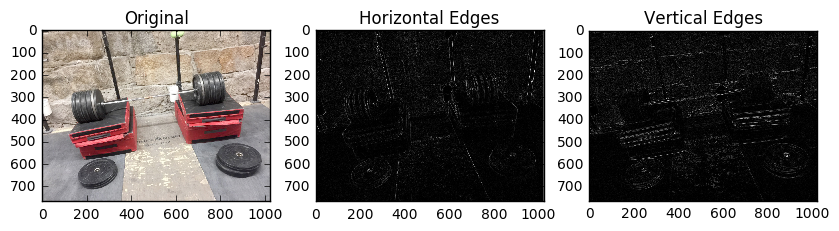

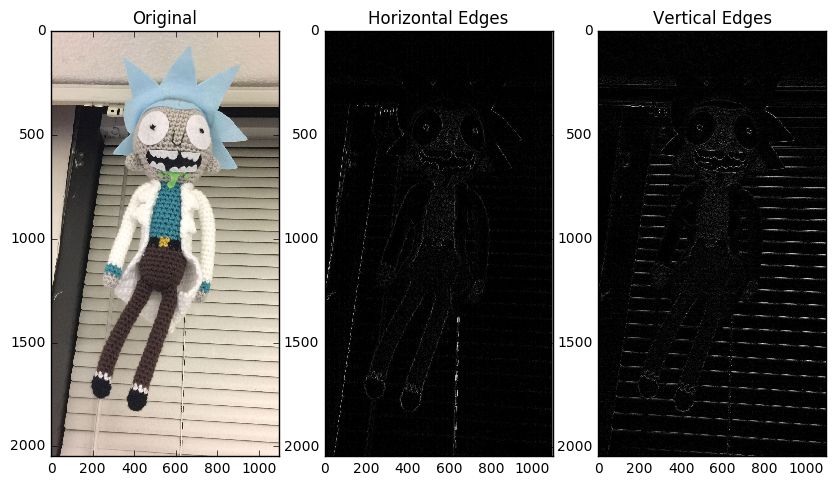

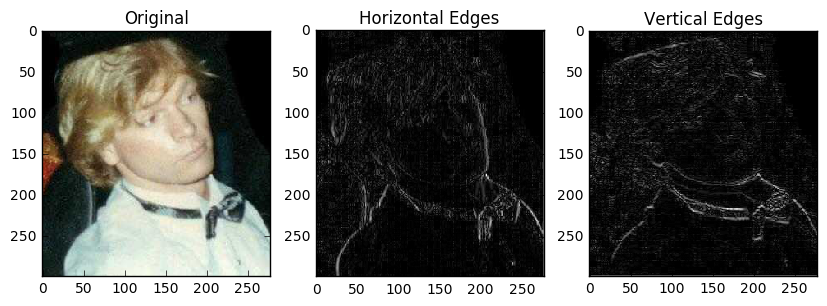

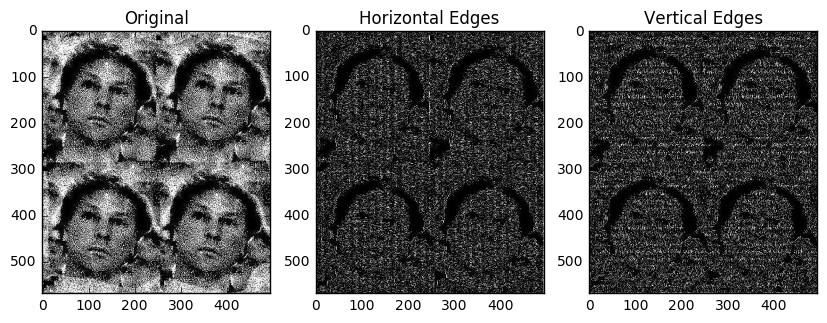

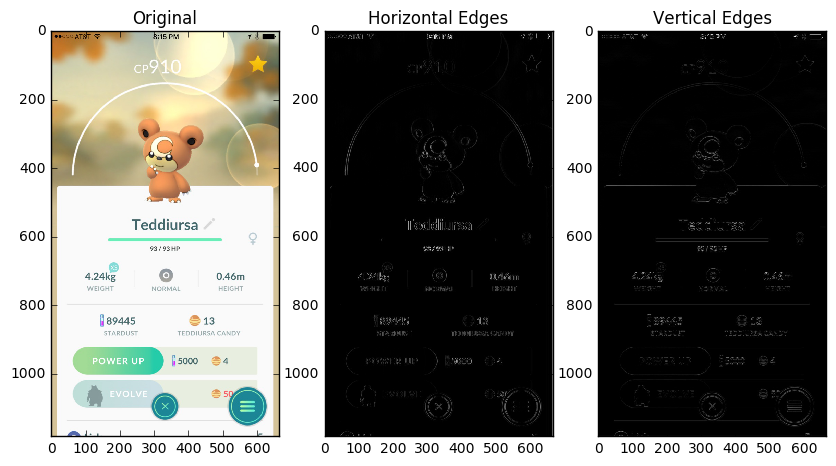

In [3]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.title('Original')
    plt.imshow(img)
    plt.subplot(1, 3, 2)
    plt.title('Horizontal Edges')
    plt.imshow(find_horizontal_edges(img))
    plt.subplot(1, 3, 3)
    plt.title('Vertical Edges')
    plt.imshow(find_vertical_edges(img))

In [4]:
# Apply a Sobel filter to the image.
def roll_your_own_sobel(img):
    sobel_kernel = np.array([[-1, 0, +1],[-2, 0, +2],[-1, 0, +1]])
    Gx = convolve(img, sobel_kernel)
    Gy = convolve(img, -sobel_kernel.transpose())
    return np.sqrt(np.square(Gx) + np.square(Gy))

# This should do the same thing as skimage.filters.sobel(img)

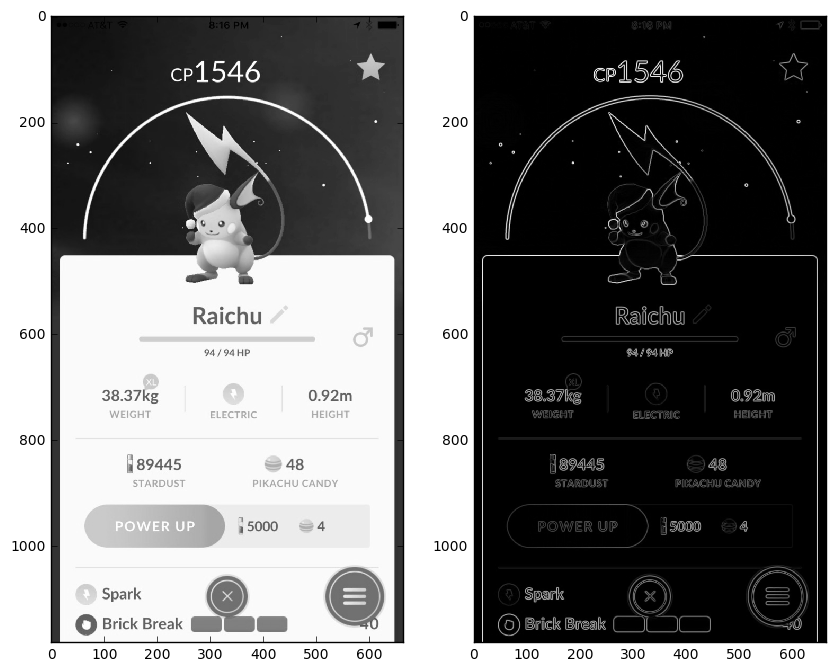

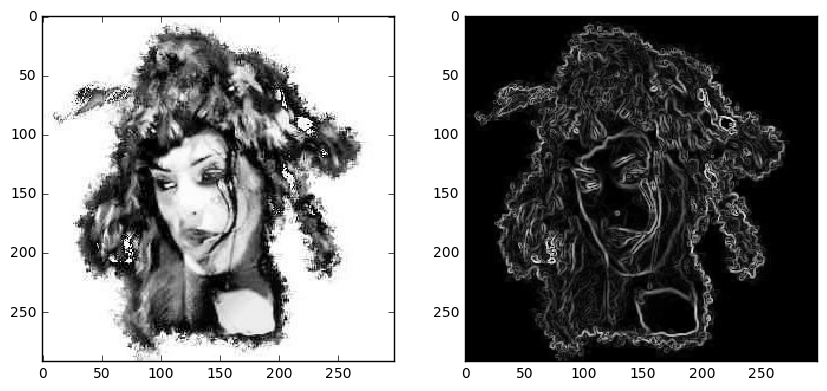

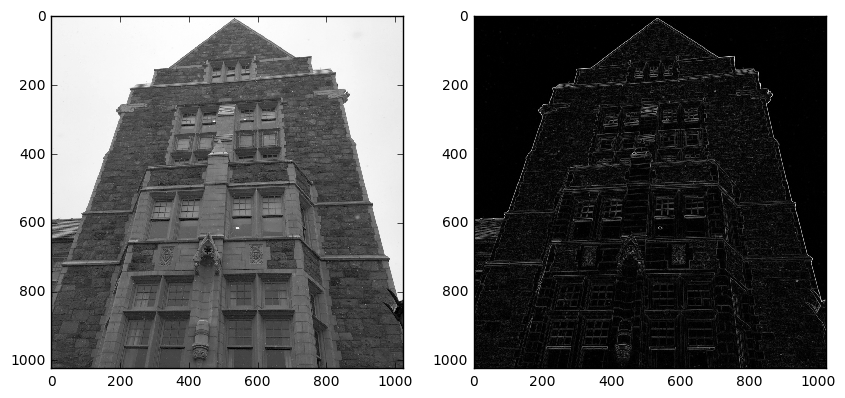

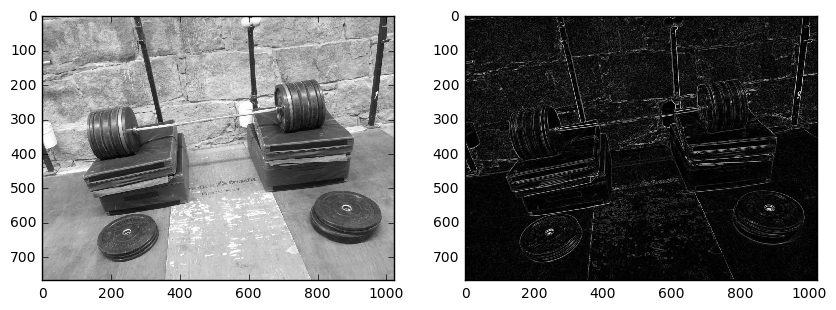

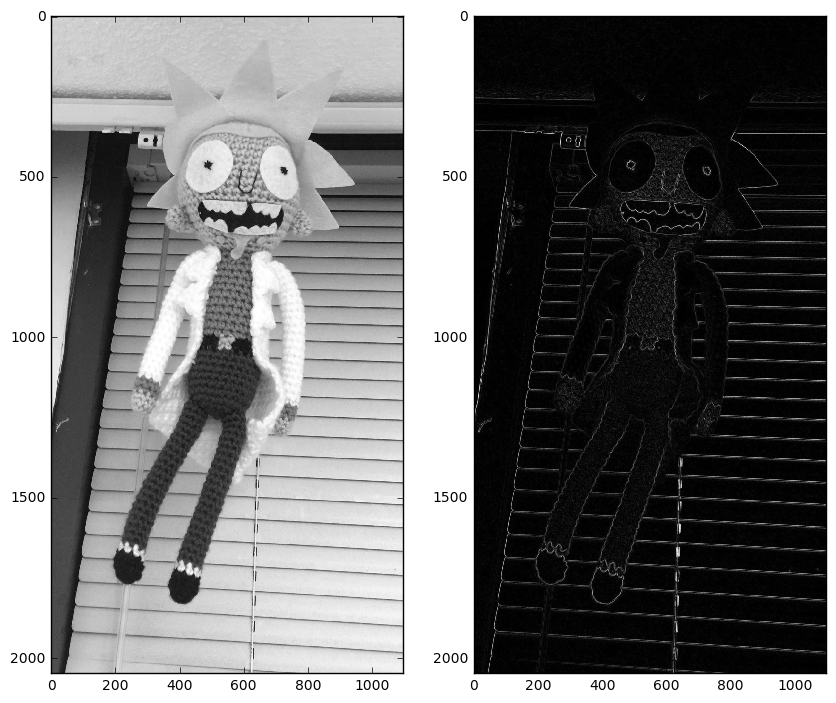

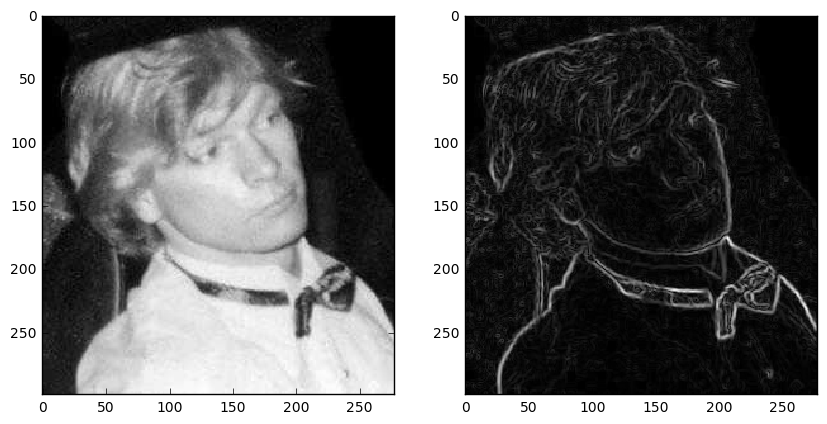

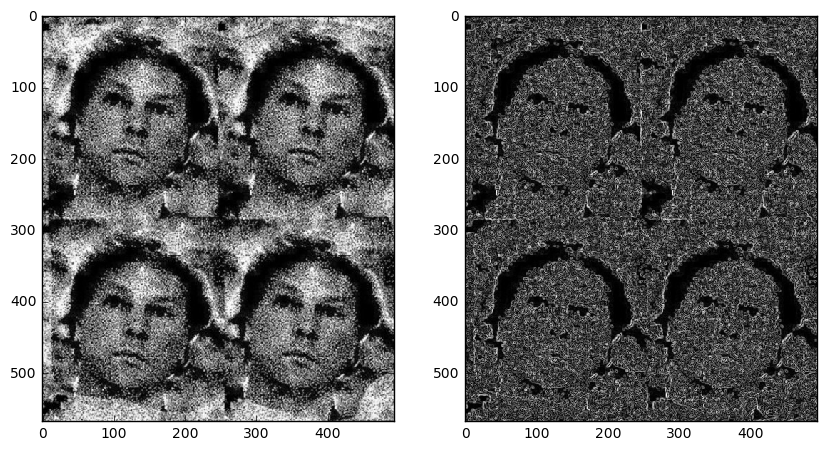

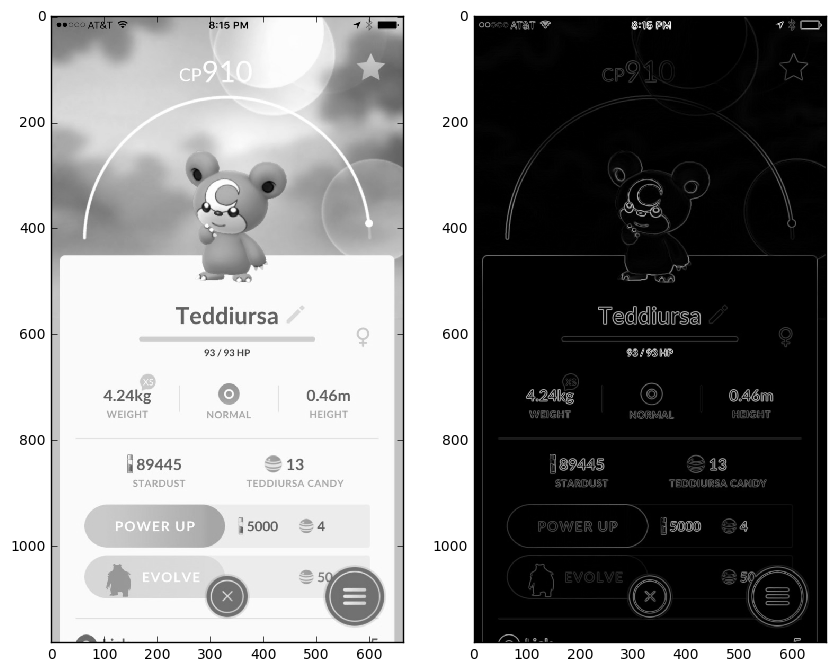

In [5]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(roll_your_own_sobel(imgbw))

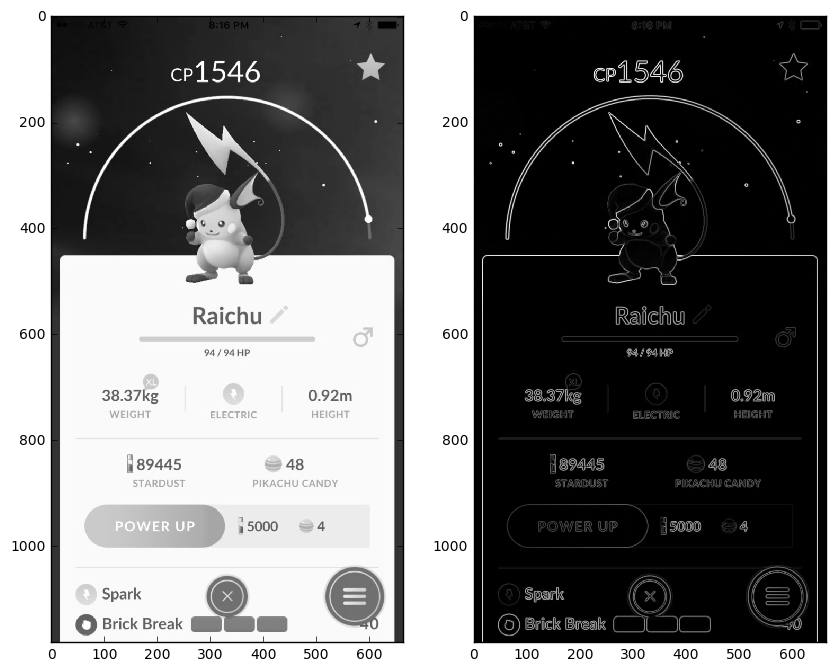

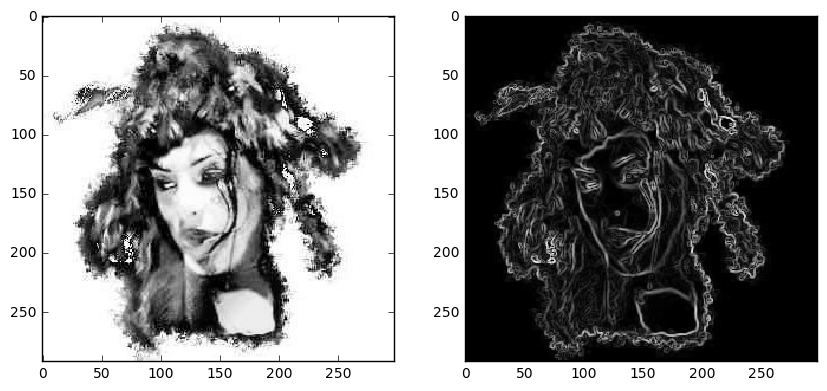

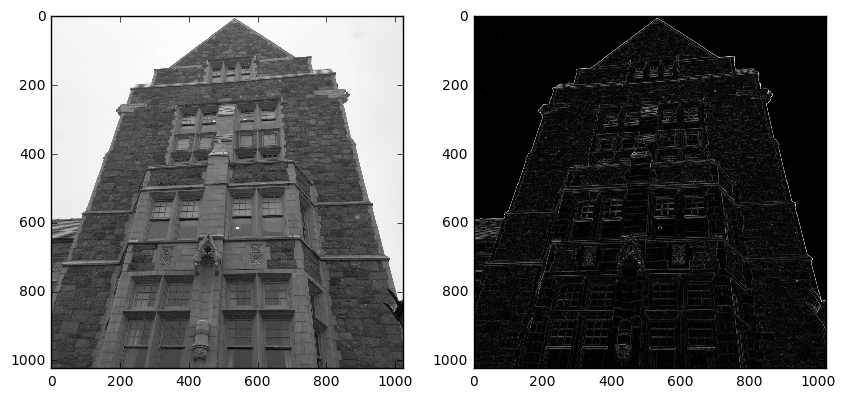

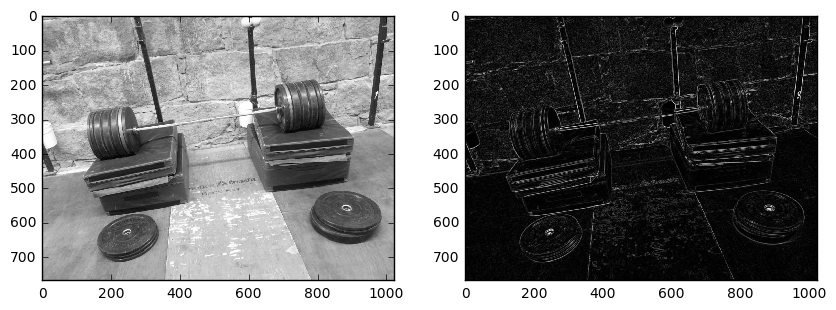

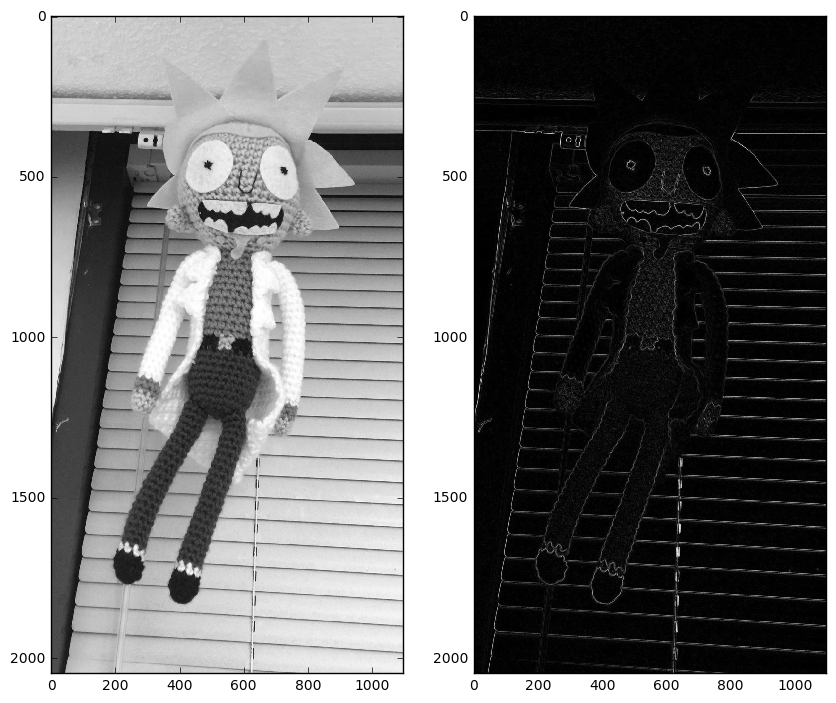

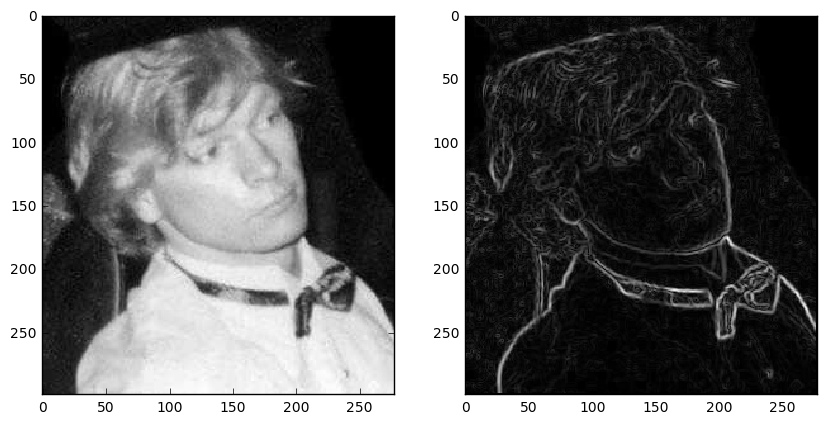

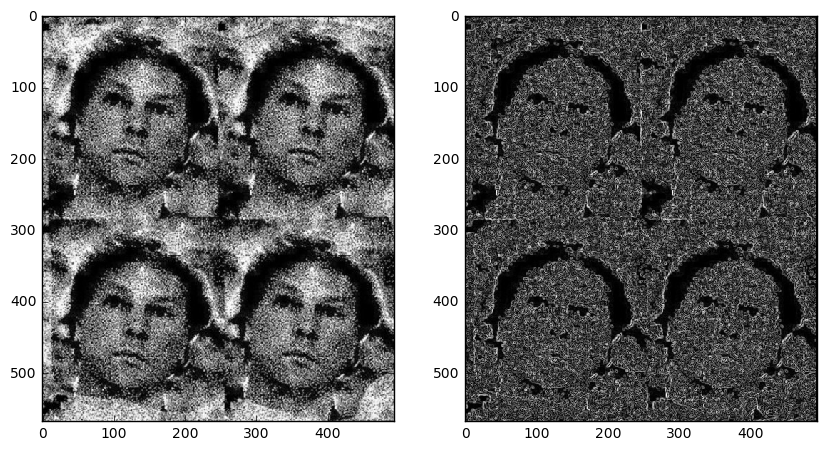

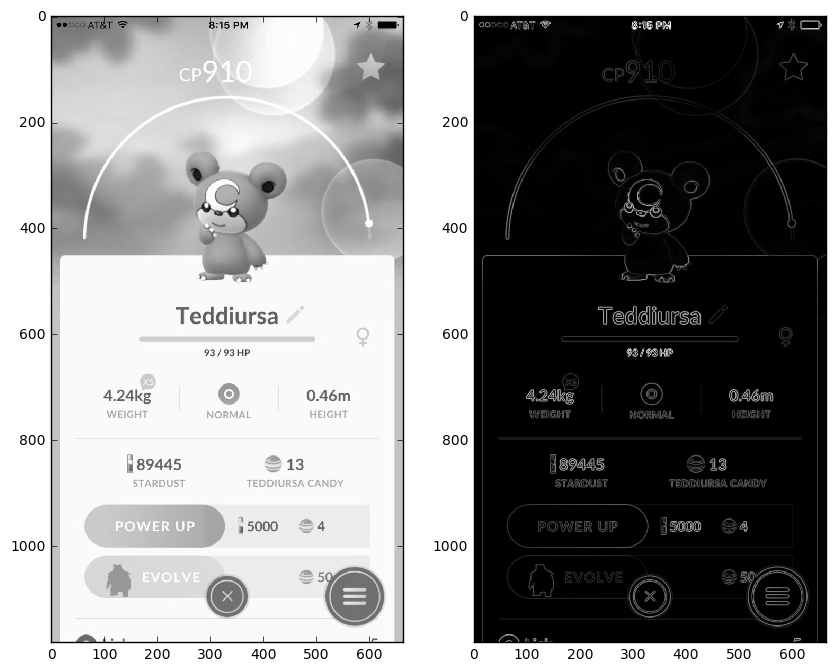

In [6]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(filters.sobel(imgbw))

# Python Tutorials

Python 101 [Beginning Python http://www.rexx.com/~dkuhlman/python_101/python_101.html](Beginning Python http://www.rexx.com/~dkuhlman/python_101/python_101.html)

The Official Python Tutorial - [http://www.python.org/doc/current/tut/tut.html](http://www.python.org/doc/current/tut/tut.html() 

The Python Quick Reference -[http://rgruet.free.fr/PQR2.3.html](http://rgruet.free.fr/PQR2.3.html) 

YouTube Python Tutorials 

Google Python Class - [http://www.youtube.com/watch?v=tKTZoB2Vjuk](http://www.youtube.com/watch?v=tKTZoB2Vjuk) 
                                                                              
Python Fundamentals Training – Classes [http://www.youtube.com/watch?v=rKzZEtxIX14](http://www.youtube.com/watch?v=rKzZEtxIX14)

Python 2.7 Tutorial Derek Banas - [http://www.youtube.com/watch?v=UQi-L-_chcc](http://www.youtube.com/watch?v=UQi-L-_chcc)

Python Programming Tutorial thenewboston - [http://www.youtube.com/watch?v=4Mf0h3HphEA](http://www.youtube.com/watch?v=4Mf0h3HphEA)







# Evaluation

Install Anaconda 4 for  Python 2.7 and get this notebook to run with a set of your images.
